# Practical Work:

In [1]:
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt

In [2]:
V = sio.loadmat("attfaces.mat")['V']
# Dimensions of each image
ImgDims = (92, 112)
N = 400

In [3]:
def get_images(V):
    imgs = [np.reshape(V[:, i], ImgDims).T for i in range(V.shape[1])]
    return np.array(imgs)

def plot_subject(images, subject=0, cmap='gray'):
    fig, axes = plt.subplots(1, 10, figsize=(50, 50))
    print("Images of subject %d"%subject)
    for idx, i in enumerate(range(subject*10, 10*(subject+1))):
        axes[idx].imshow(images[i], cmap=cmap)


imgs = get_images(V)

### A sample of the input data images:

In [4]:
V.shape

(10304, 400)

In [5]:
def matricize(imgs, nb_imgs=400, ImgDims = ImgDims):
    """
    This function is only used to visualize the images as a matrix
    (Has no effect on any of the process)
    """
    mat = np.zeros((ImgDims[1] * int(np.sqrt(nb_imgs)) , ImgDims[0] * int(np.sqrt(nb_imgs))))
    k = 0
    n = 0
    for i in range(int(np.sqrt(nb_imgs))) :
        m = 0
        for j in range(int(np.sqrt(nb_imgs))) :
            mat[n : (n + ImgDims[1] ) , m : (m + ImgDims[0] )] = imgs[k]
            m += ImgDims[0]
            k +=1
        n += ImgDims[1]
        
    return mat

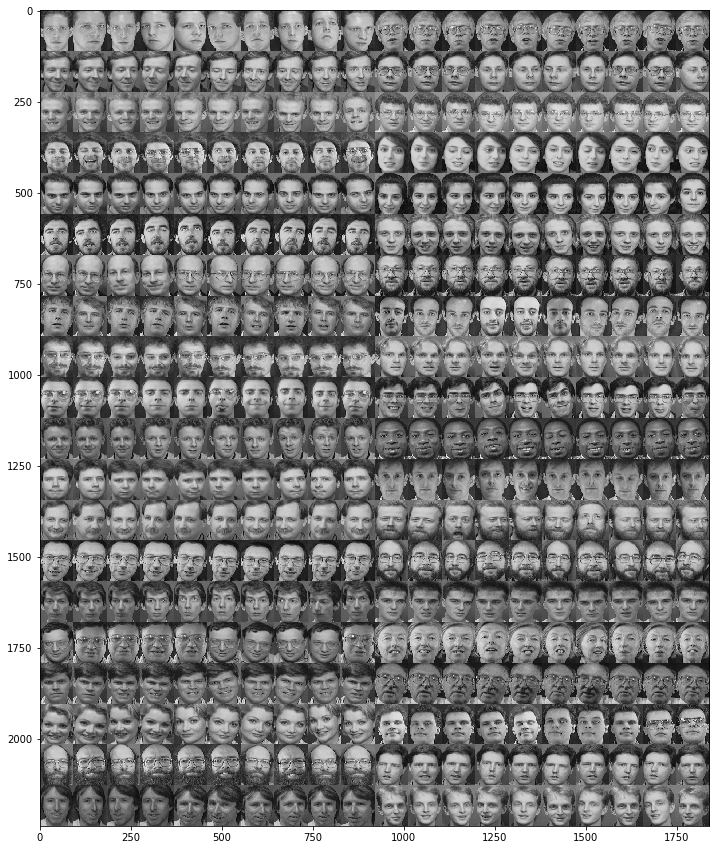

In [6]:
mat = matricize(imgs)
plt.figure(figsize=(30,15))
plt.imshow(mat, cmap='gray')

##### Visualize the image of one subject: the parameter subject $\in$ [0,40[

Images of subject 1


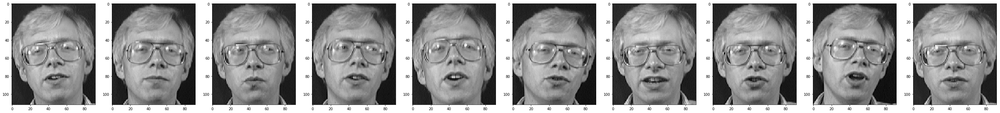

In [7]:
plot_subject(imgs, subject=1)

## Question 2.1:

## Implementation of the EM algorithm:

In [8]:
def EM_Algorithm(V, W, H, params, n_iter=5):
    V0 = V.copy()
    old_W = W.copy()
    old_H = H.copy()
    old_V_hat = W.dot(H)

    new_W = W.copy()
    new_H = H.copy()

    ones_v = np.ones(V.shape)
    ones_w = np.ones(W.shape)
    ones_h = np.ones(H.shape)

    # Setup the dimensions
    K = params['K']
    F = params['F']
    N = params['N']
    alpha_w = params['alpha_w']
    alpha_h = params['alpha_h']
    beta_w = params['beta_w']
    beta_h = params['beta_h']

    for i in range(n_iter):
        # Compute the new W
        new_W = (alpha_w - 1) * ones_w + np.multiply(old_W,
                                                     np.divide(V0, old_V_hat).dot(old_H.T))
        new_W /= beta_w * ones_w + ones_v.dot(old_H.T)

        # Compute the new H
        new_H = (alpha_h - 1) * ones_h + np.multiply(old_H,
                                                     old_W.T.dot(np.divide(V0, old_V_hat)))
        new_H /= beta_h*ones_h + old_W.T.dot(ones_v)

        # Overwrite the old values of W
        old_W = new_W.copy()
        # Overwrite the old values of H
        old_H = new_H.copy()
        # Compute the new V_hat values and overwrite the old one
        old_V_hat = new_W.dot(new_H)

    return new_W, new_H

### A way to see what features we have detected:

In [9]:
def plot_features(features, K, notes=""):
    cols = min(10, K)
    rows = int(K/cols) + 1
    fig = plt.figure(figsize=(10, 5))
    fig.suptitle("Extracted face features for K =%d " %
                 K + notes, fontsize=15, alpha=2)
    for idx in range(K):
        ax = fig.add_subplot(rows, cols, idx + 1, xticks=[], yticks=[])
        plt.subplots_adjust(wspace=0, hspace=0)
        ax.imshow(features[idx], cmap='gray')

### Test params: $\alpha_w = \alpha_h =1\ ;\ \beta_h = \beta_w =1\ ;\ K = 25$

In [10]:
# Setting up the params for the EM Algorithm
F = ImgDims[0] * ImgDims[1]
N = 400
K = 25
alpha_w = 1
alpha_h = 1
beta_w = 1
beta_h = 1

params = dict(K=K, F=F, N=N, alpha_w=alpha_w,
              alpha_h=alpha_h, beta_w=beta_w, beta_h=beta_h)

In [11]:
# Initialize H and W
W = np.random.gamma(alpha_w, scale=1/beta_w, size=(F, K))
H = np.random.gamma(alpha_h, scale=1/beta_h, size=(K, N))

In [12]:
print("The shape of the matrix W: (%d,%d)"%(W.shape[0],W.shape[1]))
print("The shape of the matrix H: (%d,%d)"%(H.shape[0],H.shape[1]))

The shape of the matrix W: (10304,25)
The shape of the matrix H: (25,400)


In [13]:
W_res, H_res = EM_Algorithm(V, W, H, params=params, n_iter=1000)

#### Estimation of the real image after running the EM-algorithm for 1000 iterations:

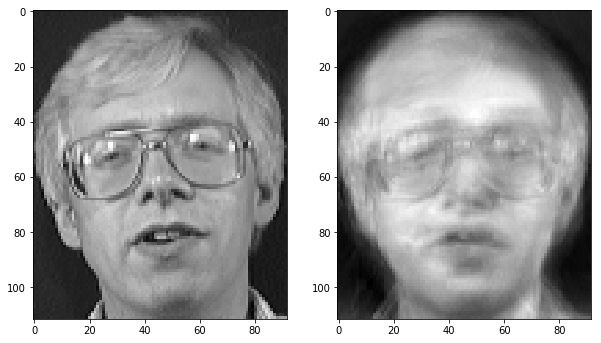

In [14]:
V_hat = W_res.dot(H_res)
imgs_hat = get_images(V_hat)

fig, axes = plt.subplots(1, 2, figsize=(10, 10))
axes[0].imshow(imgs[10], cmap='gray')
axes[1].imshow(imgs_hat[10], cmap='gray')

##### Visualize the estimation of the images:

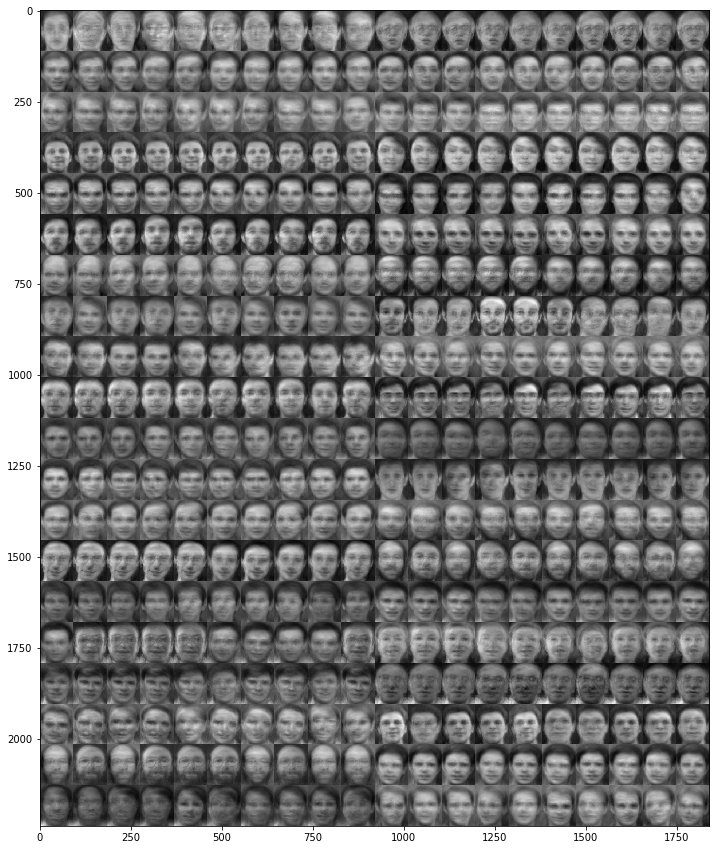

In [15]:
mat = matricize(imgs_hat)
plt.figure(figsize=(30,15))
plt.imshow(mat, cmap='gray')

##### We can see that we are close but we can do better if we choose the appropriate values of $\alpha_w, \alpha_h, \beta_w, \beta_h$

In [16]:
features = get_images(W_res)

#### The face features that we extracted after running the EM-algorithm:

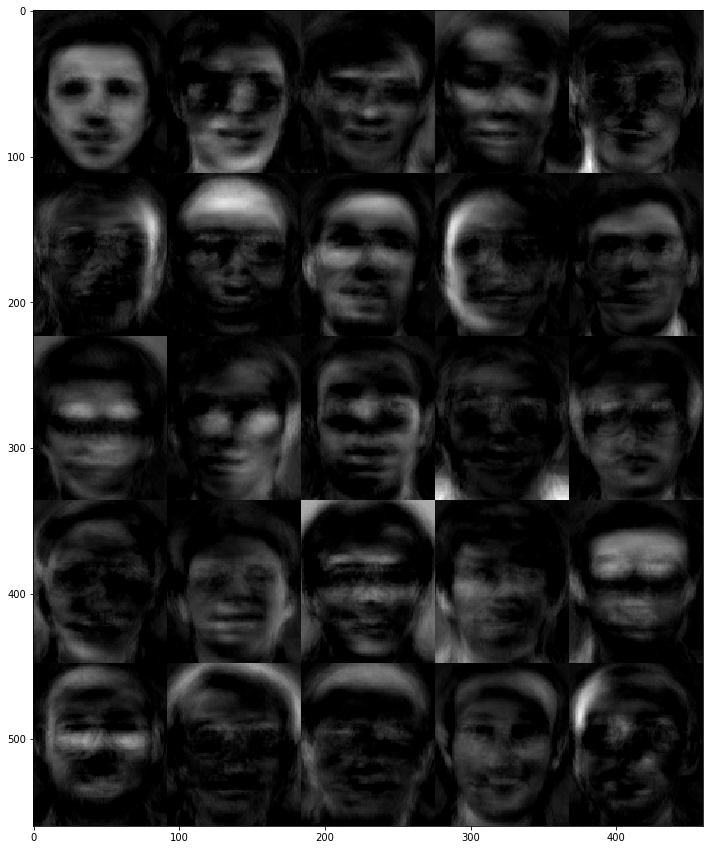

In [17]:
plt.figure(figsize=(15,15))
plt.imshow(matricize(features, nb_imgs=K),cmap='gray')

### Simulation function for trying out different values of $\beta_w, \beta_h, \alpha_w, \alpha_h$ :

In [18]:
def simulate(a, b, alphas=False, betas=True, componenets=False, niter=200):
    """
    Try out different values for alphas, betas and the # of components
    """
    # Setting up the Default params for the EM Algorithm
    F = ImgDims[0] * ImgDims[1]
    N = 400
    K = 25
    alpha_w = 1
    alpha_h = 1
    beta_w = 1
    beta_h = 1

    params = dict(K=K, F=F, N=N, alpha_w=alpha_w,
                  alpha_h=alpha_h, beta_w=beta_w, beta_h=beta_h)

    list_features = []
    if betas:
        print("Trying different values for beta_w and beta_h")
        for idx, (beta_w, beta_h) in enumerate(zip(a, b)):
            print("Iteration #%d: Running....." % (idx+1))
            print("beta_w = %.2f ; beta_h = %.2f" % (beta_w, beta_h))
            # Set up the params for the EM-algorithm
            params = dict(K=K, F=F, N=N, alpha_w=alpha_w,
                          alpha_h=alpha_h, beta_w=beta_w, beta_h=beta_h)
            # Generate new H and W for beta_w and beta_h
            W = np.random.gamma(alpha_w, scale=1/beta_w, size=(F, K))
            H = np.random.gamma(alpha_h, scale=1/beta_h, size=(K, N))
            # Run the EM-algorithm
            W_res, H_res = EM_Algorithm(V, W, H, params=params, n_iter=niter)
            list_features.append(get_images(W_res))
        print("Simulation finished successfully")
        list_features = np.array(list_features)
        for idx in range(list_features.shape[0]):
            plt.figure(figsize=(10, 10))
            plt.title(r"$\beta_w$ = " + str(list(zip(a, b))
                                          [idx][0]) + r" $\beta_h$ = " + str(list(zip(a, b))[idx][1]))
            plt.imshow(matricize(list_features[idx], nb_imgs=K), cmap='gray')
#             plot_features(
#                 list_features[idx], K, notes="and (beta_w , beta_h) = "+str(list(zip(a, b))[idx]))
        return list_features
    if alphas:
        print("Trying different values for alpha_w and alpha_h")
        for idx, (alpha_w, alpha_h) in enumerate(zip(a, b)):
            print("Iteration #%d: Running....." % (idx+1))
            print("alpha_w = %.2f ; alpha_h = %.2f" % (alpha_w, alpha_h))
            # Set up the params for the EM-algorithm
            params = dict(K=K, F=F, N=N, alpha_w=alpha_w,
                          alpha_h=alpha_h, beta_w=beta_w, beta_h=beta_h)
            # Generate new H and W for alpha_w and alpha_h
            W = np.random.gamma(alpha_w, scale=1/beta_w, size=(F, K))
            H = np.random.gamma(alpha_h, scale=1/beta_h, size=(K, N))
            # Run the EM-algorithm
            W_res, H_res = EM_Algorithm(V, W, H, params=params, n_iter=niter)
            list_features.append(get_images(W_res))
        print("Simulation finished successfully")
        list_features = np.array(list_features)
        for idx in range(list_features.shape[0]):
            plt.figure(figsize=(10, 10))
            plt.title(r"$\alpha_w$ =" + str(list(zip(a, b))
                                          [idx][0]) + r" $\alpha_h$ = " + str(list(zip(a, b))[idx][1]))
            plt.imshow(matricize(list_features[idx], nb_imgs=K), cmap='gray')
#             plot_features(
#                 list_features[idx], K, notes="and (alpha_w , alpha_h) = "+str(list(zip(a, b))[idx]))
        return list_features
    if componenets:
        for idx, K in enumerate(a):
            print("Iteration #%d: Running....." % (idx+1))
            print("K = %d" % K)
            # Set up the params for the EM-algorithm
            params = dict(K=K, F=F, N=N, alpha_w=alpha_w,
                          alpha_h=alpha_h, beta_w=beta_w, beta_h=beta_h)
            # Generate new H and W for beta_w and beta_h
            W = np.random.gamma(alpha_w, scale=1/beta_w, size=(F, K))
            H = np.random.gamma(alpha_h, scale=1/beta_h, size=(K, N))
            # Run the EM-algorithm
            W_res, H_res = EM_Algorithm(V, W, H, params=params, n_iter=niter)
            list_features.append(get_images(W_res))
        print("Simulation finished successfully")
        list_features = np.array(list_features)
        for idx in range(list_features.shape[0]):
            plot_features(
                list_features[idx], a[idx], notes="")
        return list_features

## Question 2.2:

### Choosing different values for $\beta_w$ and $\beta_h$ where $\beta_w \neq \beta_h$:

Trying different values for beta_w and beta_h
Iteration #1: Running.....
beta_w = 0.10 ; beta_h = 10.00
Iteration #2: Running.....
beta_w = 0.50 ; beta_h = 5.00
Iteration #3: Running.....
beta_w = 1.00 ; beta_h = 2.00
Iteration #4: Running.....
beta_w = 2.00 ; beta_h = 1.00
Iteration #5: Running.....
beta_w = 5.00 ; beta_h = 0.50
Iteration #6: Running.....
beta_w = 10.00 ; beta_h = 0.10
Iteration #7: Running.....
beta_w = 100.00 ; beta_h = 0.01
Simulation finished successfully


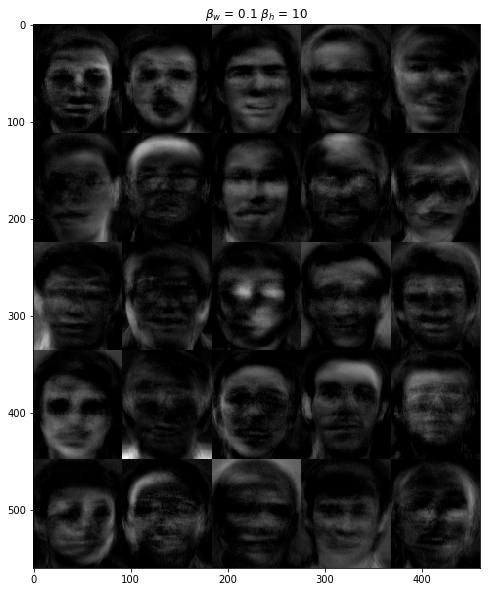

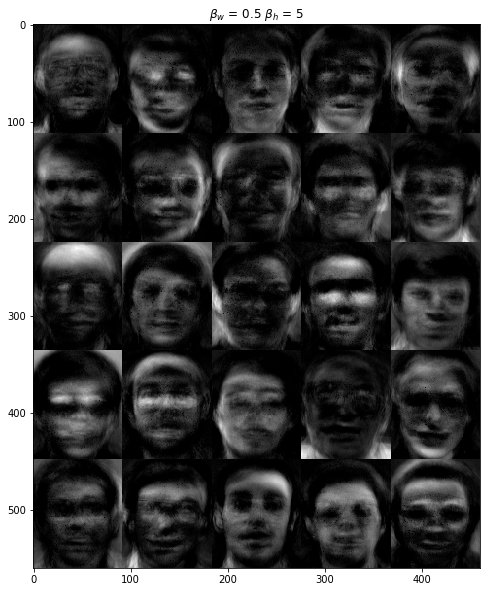

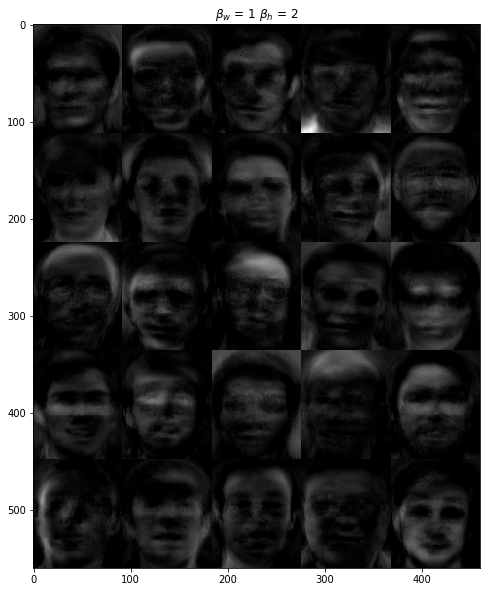

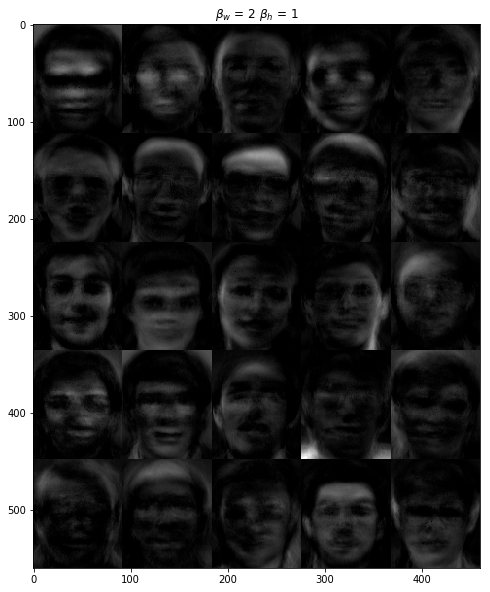

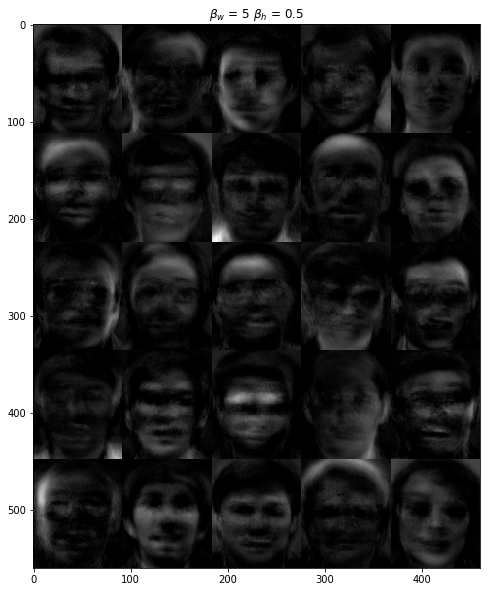

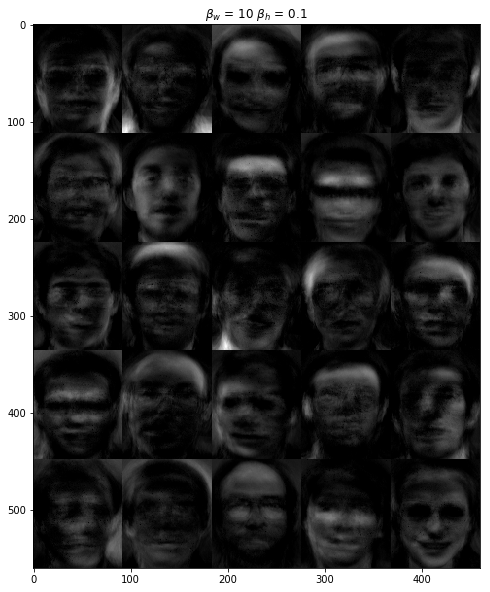

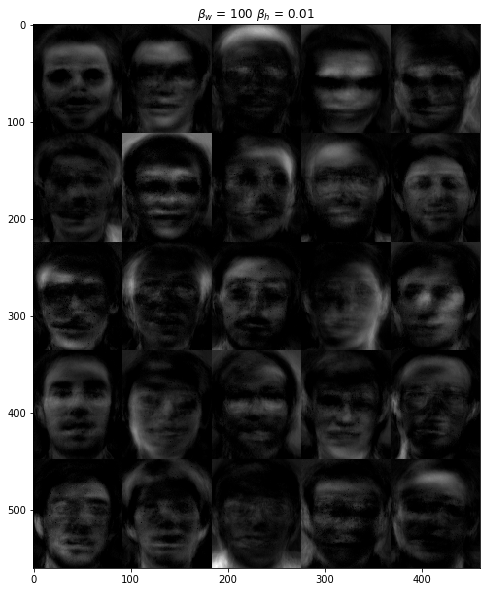

In [19]:
beta1 = [0.1, 0.5, 1, 2, 5, 10, 100]
beta2 = [10, 5, 2, 1, 0.5, 0.1, 0.01]

list_features_beta = simulate(beta1, beta2)

### Choosing different values for $\beta_w$ and $\beta_h$ where $\beta_w = \beta_h$:

Trying different values for beta_w and beta_h
Iteration #1: Running.....
beta_w = 0.10 ; beta_h = 0.10
Iteration #2: Running.....
beta_w = 0.50 ; beta_h = 0.50
Iteration #3: Running.....
beta_w = 1.00 ; beta_h = 1.00
Iteration #4: Running.....
beta_w = 2.00 ; beta_h = 2.00
Iteration #5: Running.....
beta_w = 5.00 ; beta_h = 5.00
Iteration #6: Running.....
beta_w = 10.00 ; beta_h = 10.00
Iteration #7: Running.....
beta_w = 100.00 ; beta_h = 100.00
Simulation finished successfully


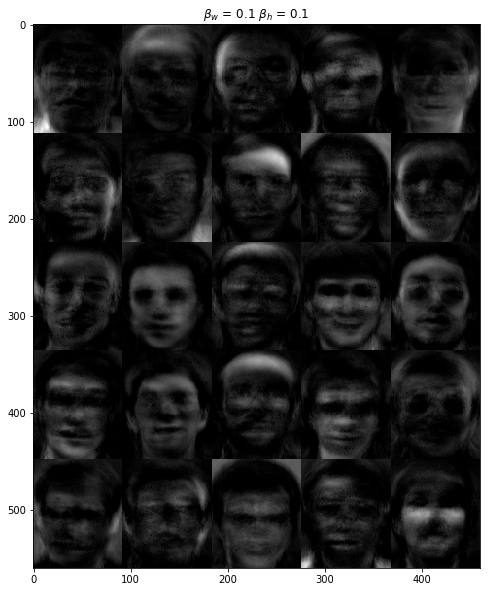

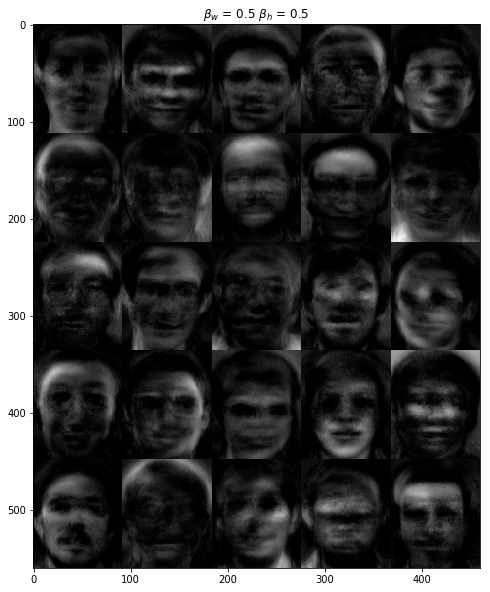

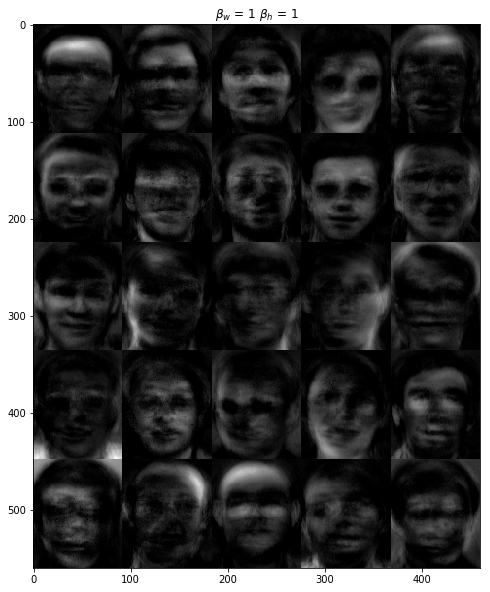

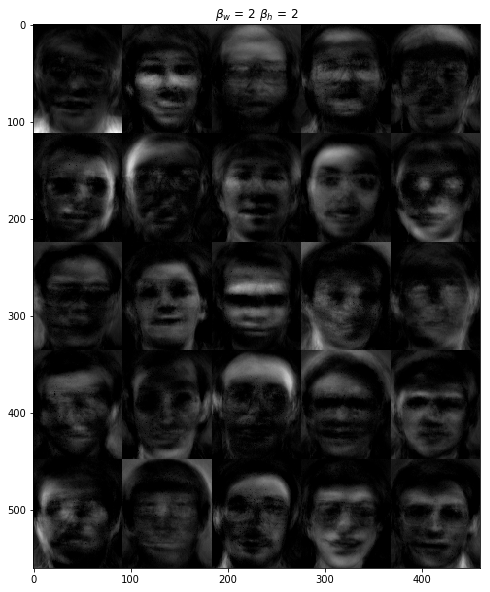

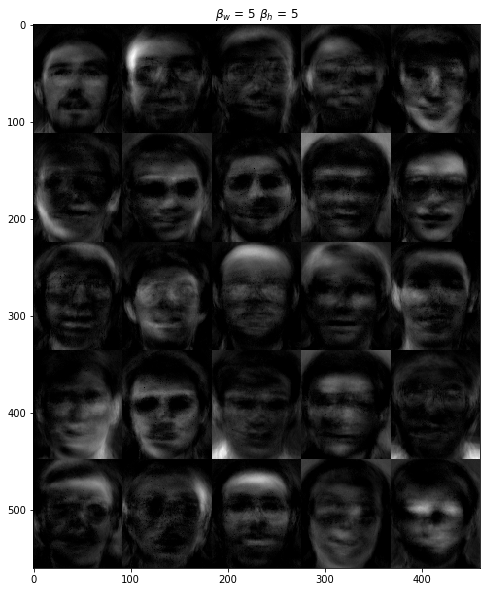

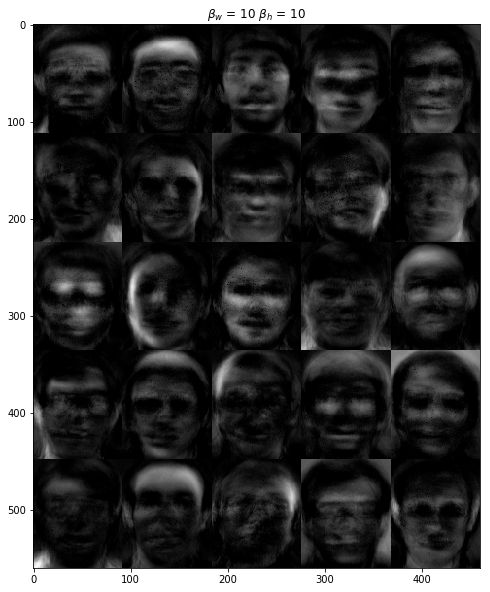

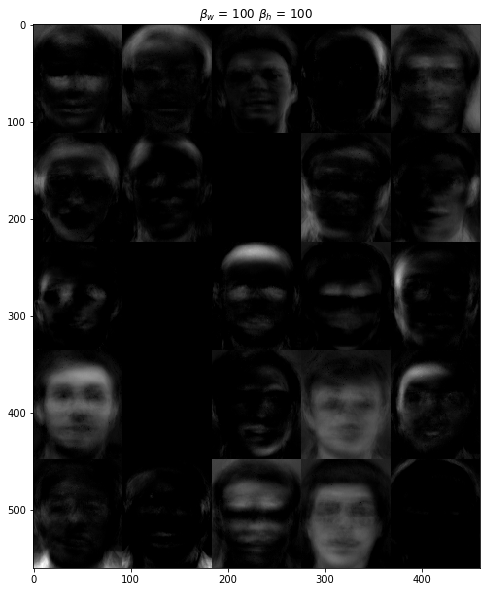

In [20]:
list_features_beta = simulate(beta1, beta1)

## Question 2.3:

### Choosing different values for $\alpha_w$ and $\alpha_h$ where $\alpha_w \neq \alpha_h$:

In [21]:
alpha1 = [0.1, 0.5, 1, 2, 5, 10, 100]
alpha2 = [10, 5, 2, 1, 0.5, 0.1, 0.01]

Trying different values for alpha_w and alpha_h
Iteration #1: Running.....
alpha_w = 0.10 ; alpha_h = 10.00
Iteration #2: Running.....
alpha_w = 0.50 ; alpha_h = 5.00
Iteration #3: Running.....
alpha_w = 1.00 ; alpha_h = 2.00
Iteration #4: Running.....
alpha_w = 2.00 ; alpha_h = 1.00
Iteration #5: Running.....
alpha_w = 5.00 ; alpha_h = 0.50
Iteration #6: Running.....
alpha_w = 10.00 ; alpha_h = 0.10
Iteration #7: Running.....
alpha_w = 100.00 ; alpha_h = 0.01
Simulation finished successfully


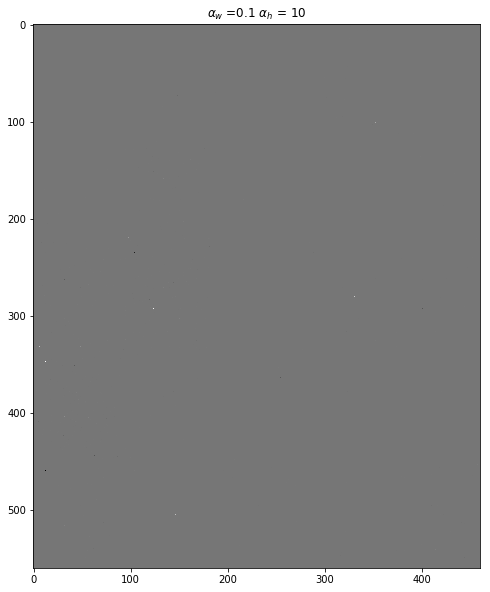

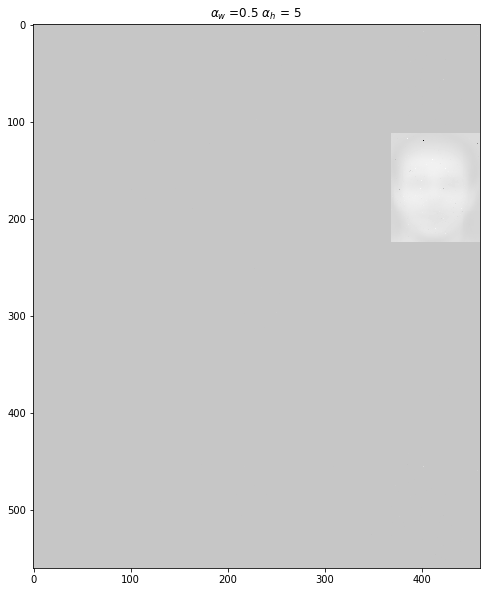

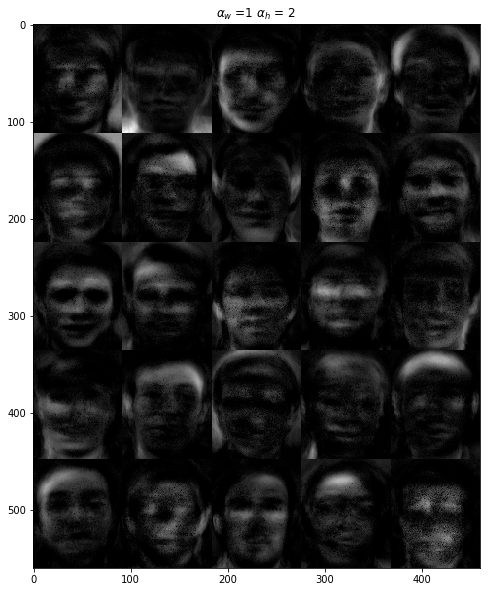

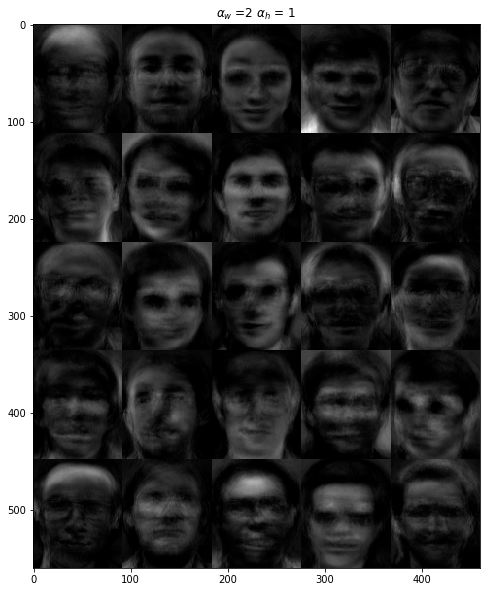

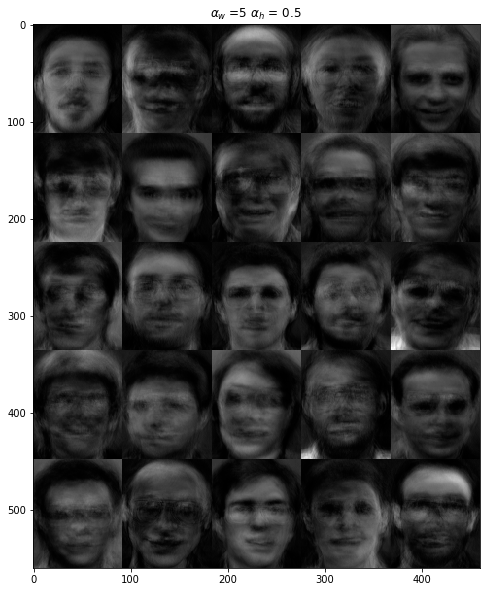

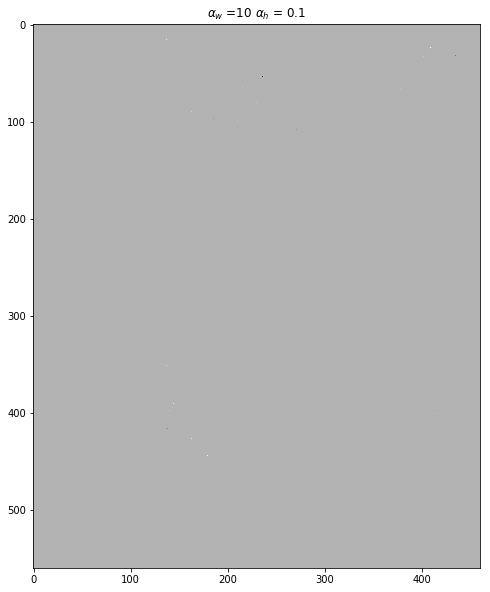

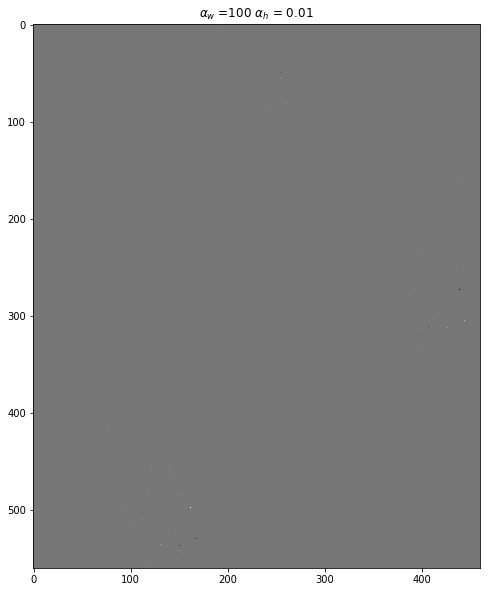

In [22]:
list_features_alpha = simulate(alpha1, alpha2, alphas=True, betas=False)

### Choosing different values for $\alpha_w$ and $\alpha_h$ where $\alpha_w = \alpha_h$:

Trying different values for alpha_w and alpha_h
Iteration #1: Running.....
alpha_w = 0.10 ; alpha_h = 0.10
Iteration #2: Running.....
alpha_w = 0.50 ; alpha_h = 0.50
Iteration #3: Running.....
alpha_w = 1.00 ; alpha_h = 1.00
Iteration #4: Running.....
alpha_w = 2.00 ; alpha_h = 2.00
Iteration #5: Running.....
alpha_w = 5.00 ; alpha_h = 5.00
Iteration #6: Running.....
alpha_w = 10.00 ; alpha_h = 10.00
Iteration #7: Running.....
alpha_w = 100.00 ; alpha_h = 100.00
Simulation finished successfully


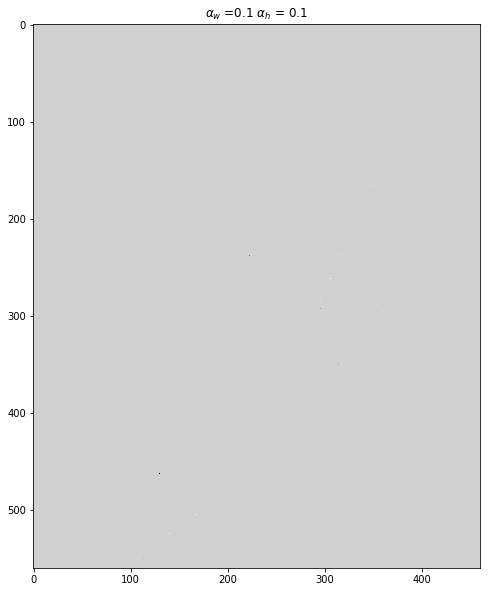

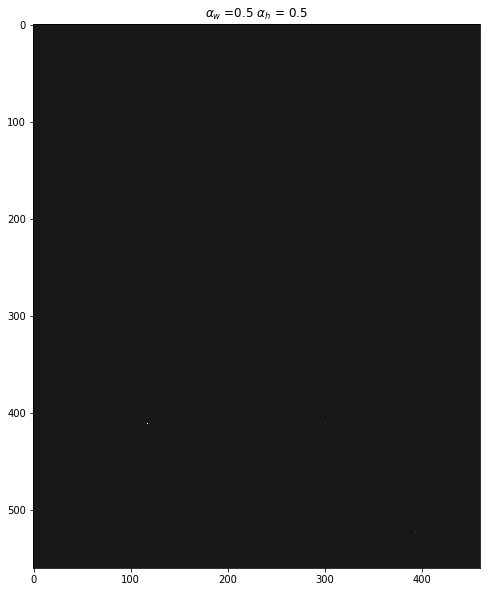

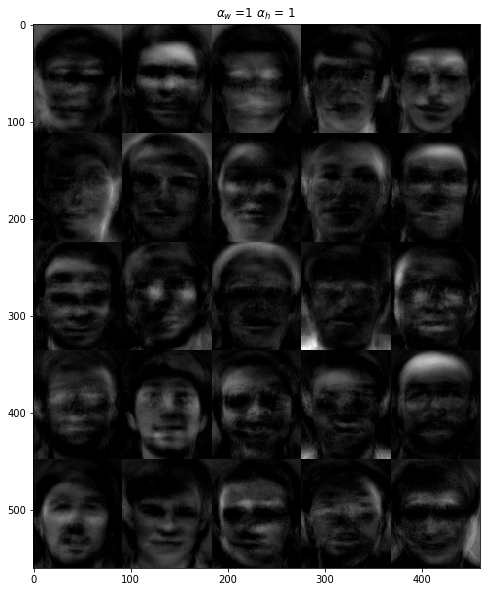

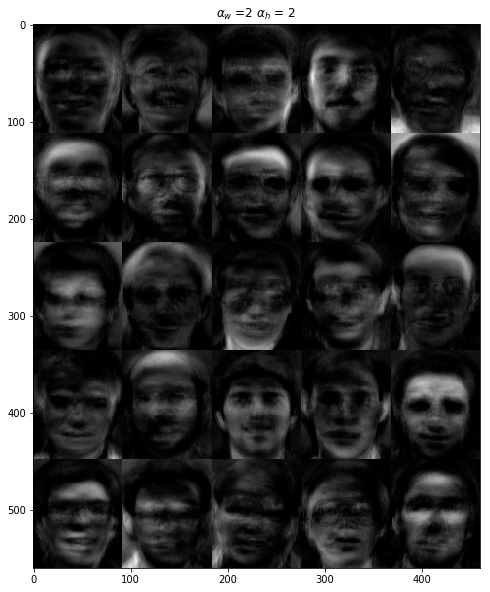

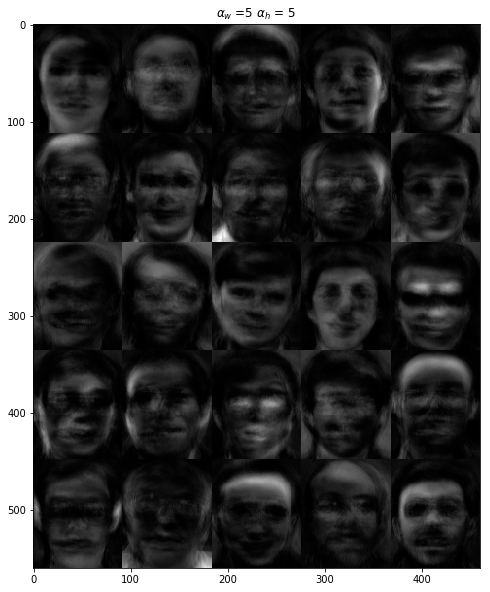

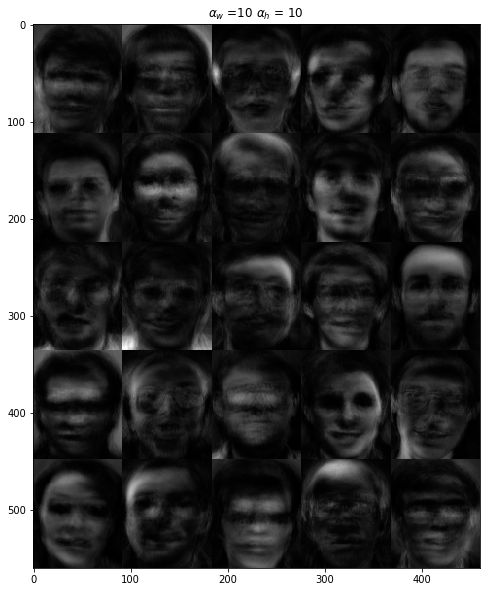

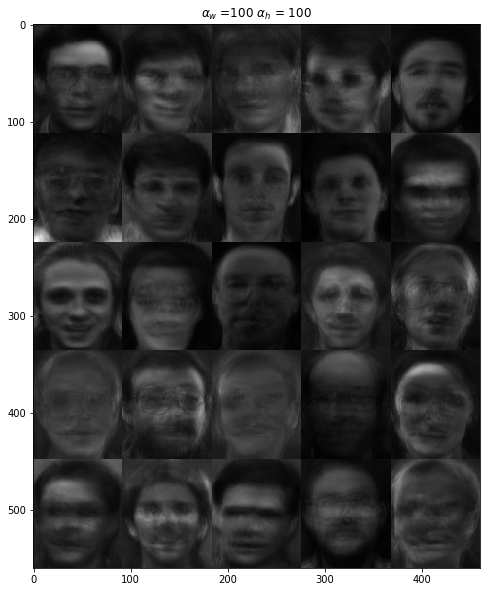

In [23]:
list_features_alpha = simulate(alpha1, alpha1, alphas=True, betas=False)

## Question 2.4:

### Trying out different values of K with a # of iterations = 300:

Iteration #1: Running.....
K = 3
Iteration #2: Running.....
K = 5
Iteration #3: Running.....
K = 7
Iteration #4: Running.....
K = 10
Iteration #5: Running.....
K = 15
Iteration #6: Running.....
K = 20
Iteration #7: Running.....
K = 25
Iteration #8: Running.....
K = 50
Simulation finished successfully


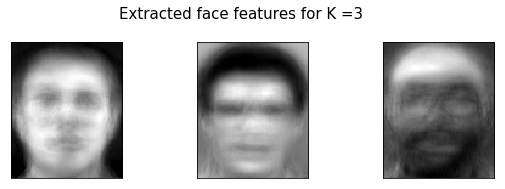

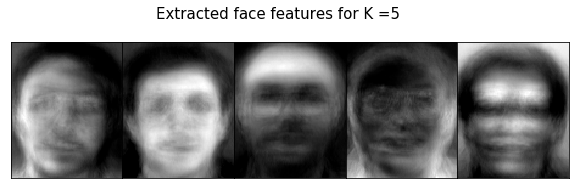

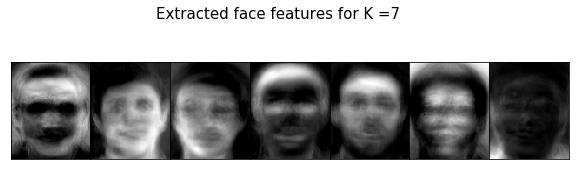

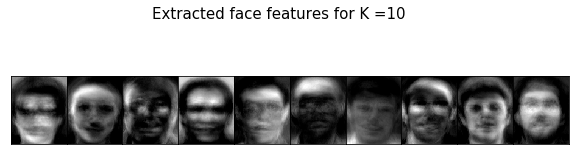

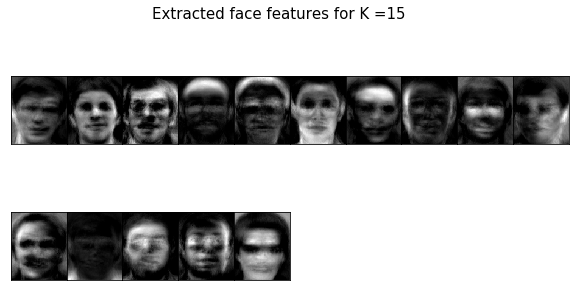

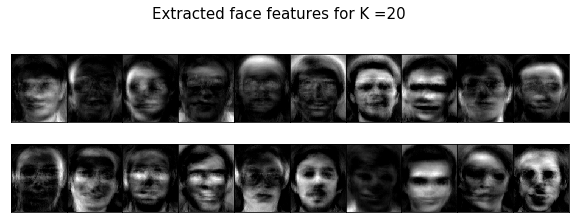

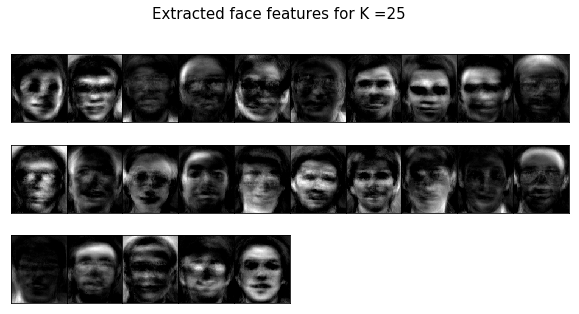

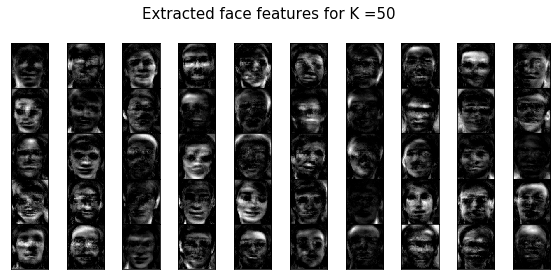

In [24]:
components = [3, 5, 7, 10, 15, 20, 25, 50]
comp_feature_list = simulate(
    components, components, betas=False, alphas=False, componenets=True, niter=300)

### Number of components $K = 100\ $ and $\alpha_w = \alpha_h = \beta_w = \beta_h = 1$

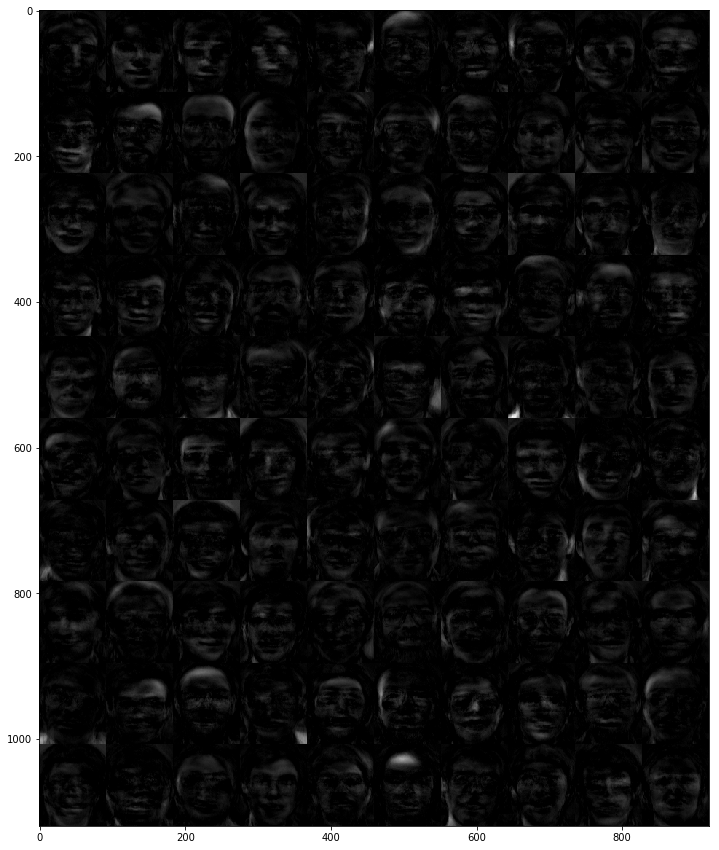

In [25]:
# Setting up the params for the EM Algorithm
F = ImgDims[0] * ImgDims[1]
N = 400
K = 100
alpha_w = 1
alpha_h = 1
beta_w = 1
beta_h = 1

params = dict(K=K, F=F, N=N, alpha_w=alpha_w,
              alpha_h=alpha_h, beta_w=beta_w, beta_h=beta_h)

# Initialize H and W
W = np.random.gamma(alpha_w, scale=1/beta_w, size=(F, K))
H = np.random.gamma(alpha_h, scale=1/beta_h, size=(K, N))
W_res, H_res = EM_Algorithm(V, W, H, params=params, n_iter=400)

imgs_hat = get_images(W_res)

plt.figure(figsize=(15,15))
plt.imshow(matricize(imgs_hat, nb_imgs=K),cmap='gray')

<div class="alert alert-block alert-success">
<b>Interpretations:</b> <br>
    <ul>
        <li><b>Varying $\alpha_w\ $ and $\ \alpha_h$:</b></li>
        For diffrent values of $\alpha$ for both W and H we can see that we change the brightness of the images, as we can see for low values of $\alpha_w\ $ and $\ \alpha_h\ $ we basically lose the images in the dark and for high values we get very bright images and the identification process of the face features becomes harder.
        The values of $(\alpha_w, \alpha_h)\ $ that gaves the best results are :(1,1); (1,2); (2,1) 
        <li><b>Varying $\beta_w\ $ and $\ \beta_h$:</b></li>
        The influence of $\beta\ $ on the images is on the contrast of the images, highlithing the face features in other words, so for very low and high values of $\beta_w\ $ and $\ \beta_h\ $ the features that are supposed to be highlighted are not being displayed very well.
        The values of $(\beta_w, \beta_h)\ $ that gave the best results are: (10,10) ; (5,5); (0.1, 0.1); (5, 0.5); (0.5, 5) 
        <li><b>Varying the number of components K:</b></li>
        When we increase the number of components we can clearly see that there are more face features beeing detected, in the last plot we can see that there a lot of features detected(nose, eyebrows, chin, etc..) but this comes at huge computational cost. Using a very low K is not a very good idea even though it speeds up the computation of the $\ \hat{V}\ $ matrix.<br>
        After trying different values of K, I can say that the best values of K should be between 10 and 25 as we can see from the plots that we can identify enough features to accurately identify a face.
    </ul>
</div>

<div class="alert alert-block alert-info">
<b>Going further:</b> <br>
    To get the best values of $\alpha_w, \alpha_h, \beta_w, \beta_h\ $ we can estimate them at each step by using the emperical unbiased estimators at each step.<br>
    Even though this estimation would increase slightly the computation time of the EM-algorithm it would yield a better estimation of $\hat{V}\ $ in a lower number of iterations. 
    $$
    \begin{align}
    \hat{\alpha}^t =\dfrac{{\hat{\mu}^2}^{(t)}}{\hat{\sigma^2}^{(t)}}\ and \ 
    \hat{\beta}^t = \dfrac{\hat{\mu}^{(t)}}{\hat{\sigma^2}^{(t)}}
    \end{align}
    $$
</div>